# Some imports

In [2]:
import pandas as pd
import pickle
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.svm import SVC
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.naive_bayes import MultinomialNB
from sklearn.pipeline import make_pipeline
import pandas as pd
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize


# Constants

- Load and save Model functions

In [3]:
def save_model(object, file: str = "save.pkl"):
      
    with open(file, "wb") as f:
        pickle.dump(object, f, pickle.HIGHEST_PROTOCOL)
def load_model(file: str = "save.pkl"): 
    with open(file, "rb") as f:
        return pickle.load(f)

# Dataset
In this lab we use part of the 'Amazon_Unlocked_Mobile.csv' dataset published by Kaggle. The dataset contain the following information:

* book title
* Authors
* categories
* Rating
* Review title
* review summary
* Review score

We are mainly interested by the 'review/summary' (X) and by the 'review/score' (y)

The goal is to try to predict the Rating after reading the Reviews

![dataset/shape](https://i.imgur.com/9ELRD7G.png)


In [78]:
rating=pd.read_csv("Books_rating.csv")

rating.head()

,Id,Title,Price,User_id,profileName,review/helpfulness,review/score,review/time,review/summary,review/text
0,1882931173,Its Only Art If Its Well Hung!,NaN,AVCGYZL8FQQTD,"Jim of Oz ""jim-of-oz""",7/7,4.0,940636800,Nice collection of Julie Strain images,This is only for Julie Strain fans. It's a col...
1,0826414346,Dr. Seuss: American Icon,NaN,A30TK6U7DNS82R,Kevin Killian,10/10,5.0,1095724800,Really Enjoyed It,I don't care much for Dr. Seuss but after read...
2,0826414346,Dr. Seuss: American Icon,NaN,A3UH4UZ4RSVO82,John Granger,10/11,5.0,1078790400,Essential for every personal and Public Library,"If people become the books they read and if ""t..."
3,0826414346,Dr. Seuss: American Icon,NaN,A2MVUWT453QH61,"Roy E. Perry ""amateur philosopher""",7/7,4.0,1090713600,Phlip Nel gives silly Seuss a serious treatment,"Theodore Seuss Geisel (1904-1991), aka &quot;D..."
4,0826414346,Dr. Seuss: American Icon,NaN,A22X4XUPKF66MR,"D. H. Richards ""ninthwavestore""",3/3,4.0,1107993600,Good academic overview,Philip Nel - Dr. Seuss: American IconThis is b...


- Drop unused columns

In [79]:
rating=rating.drop(["Price","User_id","profileName","review/helpfulness","review/time"], axis=1)

## Add a column that sorts reviews into 'positive', 'negative', 'neutral' based on the rating assigned 'review/score'

In [80]:
def rating_scale(x):
    if x > 3:
        return 'positive'
    elif x < 3:
        return 'negative'
    else:
        return 'neutral'


rating['review/scale'] = rating['review/score'].apply(rating_scale)

# Affichez le DataFrame mis à jour
rating

,Id,Title,review/score,review/summary,review/text,review/scale
0,1882931173,Its Only Art If Its Well Hung!,4.0,Nice collection of Julie Strain images,This is only for Julie Strain fans. It's a col...,positive
1,0826414346,Dr. Seuss: American Icon,5.0,Really Enjoyed It,I don't care much for Dr. Seuss but after read...,positive
2,0826414346,Dr. Seuss: American Icon,5.0,Essential for every personal and Public Library,"If people become the books they read and if ""t...",positive
3,0826414346,Dr. Seuss: American Icon,4.0,Phlip Nel gives silly Seuss a serious treatment,"Theodore Seuss Geisel (1904-1991), aka &quot;D...",positive
4,0826414346,Dr. Seuss: American Icon,4.0,Good academic overview,Philip Nel - Dr. Seuss: American IconThis is b...,positive
...,...,...,...,...,...,...
2999995,B000NSLVCU,The Idea of History,4.0,Difficult,"This is an extremely difficult book to digest,...",positive
2999996,B000NSLVCU,The Idea of History,4.0,Quite good and ahead of its time occasionally,This is pretty interesting. Collingwood seems ...,positive
2999997,B000NSLVCU,The Idea of History,4.0,Easier reads of those not well versed in histo...,"This is a good book but very esoteric. ""What i...",positive
2999998,B000NSLVCU,The Idea of History,5.0,"Yes, it is cheaper than the University Bookstore","My daughter, a freshman at Indiana University,...",positive


In [81]:
def print_scale(rating):
    print((rating['review/scale']== 'positive').sum())
    print((rating['review/scale'] == 'negative').sum())
    print((rating['review/scale']== 'neutral').sum())
    
print_scale(rating)


2392959
352746
254295


# Data Preprocessing
create a dataframe with a fair number of data in each class

In [82]:
rating_all=rating
rating=pd.concat([rating.head(50000),rating.tail(50000)])


In [83]:
condition1 = rating['review/scale'] == "negative"
condition2 = rating['review/scale'] == "neutral"
selection = rating.loc[(condition1 | condition2)]

for i in range(5):
    ranting_melange= pd.concat([rating,selection])

 
# Mélanger les lignes en utilisant sample avec frac
rating_f = ranting_melange.sample(frac=1, random_state=42)
print(rating_f)


                 Id                                              Title  \
15692    9562910334                                               1984   
49630    0753113880                              The Other Boleyn Girl   
2979227  B0000A9AYP                                            Ben Hur   
2957532  0876281242  Complete Group Counseling Program for Children...   
2970407  0333594916  Awakening: Kate Chopin Pb (Case Studies in Con...   
...             ...                                                ...   
2976820  B000Q032UY                 The Hobbit or There and Back Again   
2952552  0964920506  Sharpening the Warriors Edge: The Psychology &...   
18851    B000HJR45I                                     Finnegans Wake   
860      B000MCKQRS  Cruel and Unusual (G K Hall Large Print Book S...   
15795    9562910334                                               1984   

         review/score                           review/summary  \
15692             5.0                        

### Equalize the number of instances of each class

In [84]:

dataset = pd.concat([rating_f[(rating_f['review/scale'] == 'positive')].head(20000),rating_f[(rating_f['review/scale'] == 'negative')].head(20000),rating_f[(rating_f['review/scale'] == 'neutral')].head(10000)])

dataset_rating=pd.concat([rating_f[(rating_f['review/score'] == 1)].head(10000),rating_f[(rating_f['review/score'] == 2)].head(10000),rating_f[(rating_f['review/score'] == 3)].head(10000),rating_f[(rating_f['review/score'] == 4)].head(10000),rating_f[(rating_f['review/score'] == 5)].head(10000)])

In [85]:
#print_scale(dataset)
print_scale(dataset_rating)
print(dataset_rating)

20000
19200
10000
                 Id                                              Title  \
2970407  0333594916  Awakening: Kate Chopin Pb (Case Studies in Con...   
4446     0595234518  Body Self: take ACTION in your quest for Posit...   
2962988  0974070505                                          Hood Rich   
2987822  B000OUT71E                                    Excellent Women   
25733    0945760388                               Lottery Master Guide   
...             ...                                                ...   
2977309  B000Q032UY                 The Hobbit or There and Back Again   
9423     B000N755KK                              Empire From the Ashes   
2981595  140004006X  1491: New Revelations of the Americas Before C...   
2994316  0312495412                      First 100 Words (Bright Baby)   
33192    0394779959                        Summer of My German Soldier   

         review/score                                     review/summary  \
2970407          

### Applying lemmatization

In [86]:
# Lemmatization function
def lemmatize_text(text):
    lemmatizer = WordNetLemmatizer()
    return ' '.join([lemmatizer.lemmatize(word) for word in word_tokenize(str(text))])

# Applying lemmatization to the "review/text" column
dataset_rating["review/text"] = dataset_rating["review/text"].apply(lemmatize_text)

# Handling NaN and converting to string for "review/score" column
dataset_rating["review/score"] = dataset_rating["review/score"].apply(lambda x: str(x) if pd.notna(x) else '')

# Applying lemmatization to the "review/score" column
dataset_rating["review/score"] = dataset_rating["review/score"].apply(lemmatize_text)

print(dataset_rating)


                 Id                                              Title  \
2970407  0333594916  Awakening: Kate Chopin Pb (Case Studies in Con...   
4446     0595234518  Body Self: take ACTION in your quest for Posit...   
2962988  0974070505                                          Hood Rich   
2987822  B000OUT71E                                    Excellent Women   
25733    0945760388                               Lottery Master Guide   
...             ...                                                ...   
2977309  B000Q032UY                 The Hobbit or There and Back Again   
9423     B000N755KK                              Empire From the Ashes   
2981595  140004006X  1491: New Revelations of the Americas Before C...   
2994316  0312495412                      First 100 Words (Bright Baby)   
33192    0394779959                        Summer of My German Soldier   

        review/score                                     review/summary  \
2970407          1.0                

In [87]:
rating= dataset
X = rating['review/text'].astype(str)

y = rating['review/scale']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(40000,)
(10000,)
(40000,)
(10000,)


### TF-IDF text vectorization X_train and X_test

In [88]:
tfidf_vectorizer = TfidfVectorizer()

# Vectoriser le dataset de train
X_train_tfidf = tfidf_vectorizer.fit_transform(X_train)
# Vectoriser le dataset de test
X_test_tfidf = tfidf_vectorizer.transform(X_test)

# Models training
## guess the scale from the (text review)
### testing SVC model with kernel function 'rbf'

In [20]:
# Créer un modèle SVM RBF
svm_model = SVC(kernel='rbf')

# Entraîner le modèle sur les représentations vectorielles d'entraînement
svm_model.fit(X_train_tfidf, y_train)

# Prédire les classes sur les représentations d'entraînement
y_pred_train = svm_model.predict(X_train_tfidf)

save_model(svm_model)

# Afficher le rapport de classification pour les données d'entraînement
classification_report_train = classification_report(y_train, y_pred_train)
print("Rapport de classification pour les données d'entraînement:\n", classification_report_train)

Rapport de classification pour les données d'entraînement:
               precision    recall  f1-score   support

    negative       0.98      0.99      0.98     15986
     neutral       0.98      0.92      0.95      8050
    positive       0.97      0.98      0.98     15964

    accuracy                           0.98     40000
   macro avg       0.98      0.97      0.97     40000
weighted avg       0.98      0.98      0.98     40000



- Results

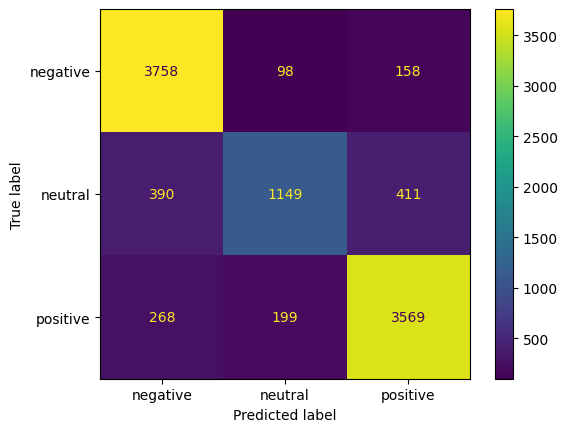

In [22]:
# Print/plot the confusion matrix
y_pred_test = svm_model.predict(X_test_tfidf)


conf_matrix_test = confusion_matrix(y_test, y_pred_test)

disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix_test, display_labels=["negative","neutral","positive"])

disp.plot()

 Display the false predicted results

In [23]:
i=0
for y_pred_test1,y_test1,X_test1 in zip(y_pred_test,y_test,X_test):
    if(y_pred_test1 != y_test1):
        print("the review:",X_test1)
        print("the true rating:",y_test1)
        print("the model rating:",y_pred_test1)
        i+=1
print(i)

the review: There was only one review on the Amazon system when I bought this book and there is still only one so I decided to add my evaluation. I do not give out 5 star ratings lightly. I am hard to please as a reader, perhaps sometimes too much so. But the point is that I pay money for the privilege of reading a romance novel and I much prefer that the author give me something worth my money. Kate Huntington has done just that.I really like the plot of this book. Christopher has spent eleven years in a succession of French prisons because no ransome was ever demanded for his release and his grandfather had received information that Christopher and his tutor had died at the hands of the French. Without knowing this, Christopher had erroneously thought that perhaps his grandfather had chosen not to pay for his release. When he returns to England he is, naturally, a very different person. Not being willing to fall in with the wish that he marry Cassandra he rides off to London to enjoy

### testing SVC model with kernel function 'linear'

In [24]:
# Créer un modèle SVM linéaire
svm_model = SVC(kernel='linear')

# Entraîner le modèle sur les représentations vectorielles d'entraînement
svm_model.fit(X_train_tfidf, y_train)

# Prédire les classes sur les représentations d'entraînement
y_pred_train = svm_model.predict(X_train_tfidf)

#save_model(svm_model)

# Afficher le rapport de classification pour les données d'entraînement
classification_report_train = classification_report(y_train, y_pred_train)
print("Rapport de classification pour les données de test:\n", classification_report_train)

Rapport de classification pour les données de test:
               precision    recall  f1-score   support

    negative       0.89      0.95      0.92     15986
     neutral       0.86      0.70      0.77      8050
    positive       0.90      0.92      0.91     15964

    accuracy                           0.89     40000
   macro avg       0.88      0.86      0.87     40000
weighted avg       0.89      0.89      0.89     40000



- Results

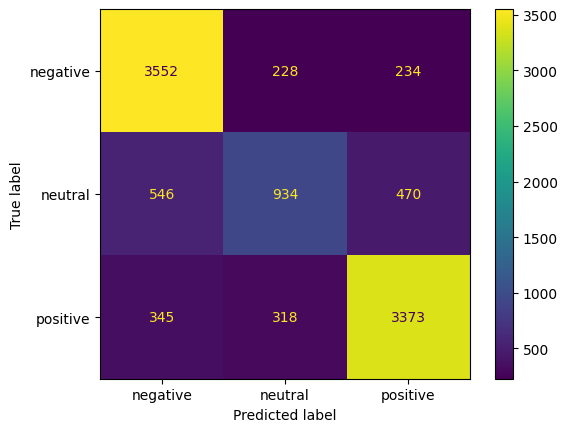

In [25]:
# Print/plot the confusion matrix
y_pred_test = svm_model.predict(X_test_tfidf)


conf_matrix_test = confusion_matrix(y_test, y_pred_test)

disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix_test, display_labels=["negative","neutral","positive"])

disp.plot()

- Display the false predicted results 

In [26]:
i=0
for y_pred_test1,y_test1,X_test1 in zip(y_pred_test,y_test,X_test):
    if(y_pred_test1 != y_test1):
        print("the review:",X_test1)
        print("the true rating:",y_test1)
        print("the model rating:",y_pred_test1)
        i+=1
print(i)

the review: There was only one review on the Amazon system when I bought this book and there is still only one so I decided to add my evaluation. I do not give out 5 star ratings lightly. I am hard to please as a reader, perhaps sometimes too much so. But the point is that I pay money for the privilege of reading a romance novel and I much prefer that the author give me something worth my money. Kate Huntington has done just that.I really like the plot of this book. Christopher has spent eleven years in a succession of French prisons because no ransome was ever demanded for his release and his grandfather had received information that Christopher and his tutor had died at the hands of the French. Without knowing this, Christopher had erroneously thought that perhaps his grandfather had chosen not to pay for his release. When he returns to England he is, naturally, a very different person. Not being willing to fall in with the wish that he marry Cassandra he rides off to London to enjoy

### MLPClassifier

In [90]:
# Create an MLPClassifier
mlp_classifier = MLPClassifier(hidden_layer_sizes=(100, ), max_iter=100, random_state=42,early_stopping=True,activation='tanh')

# Train the classifier
mlp_classifier.fit(X_train_tfidf, y_train)

# Make predictions on the test set
y_pred = mlp_classifier.predict(X_train_tfidf)


In [93]:

# Evaluate the accuracy
classification_report_train = classification_report(y_train, y_pred)
print("Classification Report for Training Data:\n", classification_report_train)


Classification Report for Training Data:
               precision    recall  f1-score   support

    negative       0.98      0.99      0.98     15986
     neutral       0.97      0.95      0.96      8050
    positive       0.98      0.98      0.98     15964

    accuracy                           0.98     40000
   macro avg       0.98      0.97      0.97     40000
weighted avg       0.98      0.98      0.98     40000



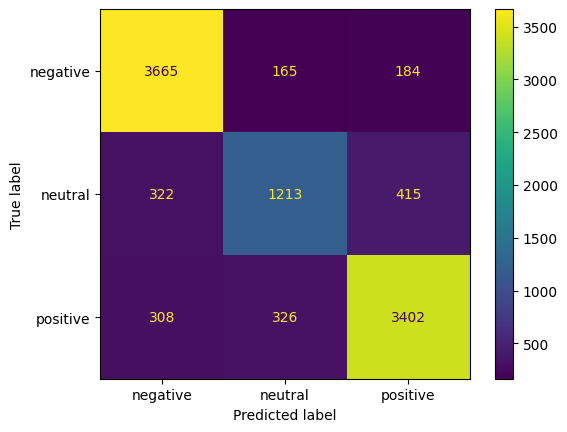

In [91]:

# Make predictions on the test set
y_pred_test = mlp_classifier.predict(X_test_tfidf)

# Calculate the confusion matrix
conf_matrix_test = confusion_matrix(y_test, y_pred_test)

# Display the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix_test, display_labels=["negative", "neutral", "positive"])
disp.plot()

In [94]:
i=0
for y_pred_test1,y_test1,X_test1 in zip(y_pred_test,y_test,X_test):
    if(y_pred_test1 != y_test1):
        print("the review:",X_test1)
        print("the true rating:",y_test1)
        print("the model rating:",y_pred_test1)
        i+=1
print(i)

the review: Was a very exciting adventures book about a simple little hobbyist who goes on an adventure with a wizard and 13 dwarves
the true rating: positive
the model rating: negative
the review: I was jumping around, especially at the end. I love listening to the Historical Books. While they contain many life lessons, they read as action and adventure epics. I would definitely go to the movies for this one. since I am a wimp, I would have to close my eyes on the gory parts.
the true rating: positive
the model rating: neutral
the review: I first came across this play in an old college literature book that belonged to my mother. My only disappointment in reading it was that I discovered it shortly after the play came out in London at The Royal Theatre...boo hoo I missed it...maybe can find a recording.To me this play was all about avoidence. The historical Russian setting was also incorporated well. I do not know much about the time or place so I can't say much about that though.It ca

 ### Naive Bayes classifier

In [27]:
model = make_pipeline(TfidfVectorizer(), MultinomialNB())

model.fit(X_train, y_train)

y_pred = model.predict(X_test)

print("\nClassification Report:")
print(classification_report(y_test, y_pred))



Classification Report:
              precision    recall  f1-score   support

    negative       0.67      0.92      0.78      4014
     neutral       1.00      0.00      0.00      1950
    positive       0.75      0.83      0.79      4036

    accuracy                           0.70     10000
   macro avg       0.81      0.58      0.52     10000
weighted avg       0.77      0.70      0.63     10000



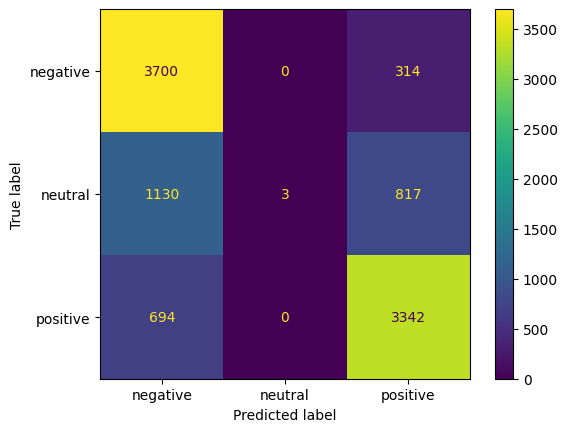

In [28]:
# Print/plot the confusion matrix
y_pred_test = model.predict(X_test)


conf_matrix_test = confusion_matrix(y_test, y_pred_test)

disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix_test, display_labels=["negative","neutral","positive"])

disp.plot()


In [29]:
i=0
for y_pred_test1,y_test1,X_test1 in zip(y_pred_test,y_test,X_test):
    if(y_pred_test1 != y_test1):
        print("the review:",X_test1)
        print("the true rating:",y_test1)
        print("the model rating:",y_pred_test1)
        i+=1
print(i)

the review: I do not own this book, and am not reviewing it. But there is a quote from the essay "On Living In An Atomic Age" that is going around once again, following the London bombings of July 2005. I am putting it here on Amazon so interested parties Googling to find the source of the quote might have an easier time of it:"If we are . . . going to be destroyed by [a] bomb, let that bomb when it comes find us doing sensible and human things--praying, working, teaching, reading, listening to music, bathing the children, playing tennis, chatting to our friends over a pint and a game of darts--not huddled together like frightened sheep and thinking about bombs."--C.S. Lewis
the true rating: positive
the model rating: negative
the review: Sci-fi novels often get philosophical, and Oryx & Crake follows suit. The science is primarily genetic engeneering. What happens when it goes too far? Lots of books have covered that topic, but this book did a fair job of it and included many aspects 

## guess the scale from the (summary) of the review

In [30]:
rating=dataset
X = rating['review/summary'].astype(str)
y = rating['review/scale']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(40000,)
(10000,)
(40000,)
(10000,)


### apply TF-IDF text vectorization X_train and X_test

In [31]:
tfidf_vectorizer = TfidfVectorizer()
X_train_tfidf = tfidf_vectorizer.fit_transform(X_train)
X_test_tfidf = tfidf_vectorizer.transform(X_test)  # Use the same vectorizer for consistency


## Models training
### guess the scale from the summery review
#### testing SVC model with kernel function 'rbf'

In [32]:
svm_model = SVC(kernel='rbf')
svm_model.fit(X_train_tfidf, y_train)

# Predicting on the training set
y_pred_train = svm_model.predict(X_train_tfidf)

# Saving the trained model
save_model(svm_model, "save2.pkl")

# Displaying the classification report for the training data
classification_report_train = classification_report(y_train, y_pred_train)
print("Classification Report for Training Data:\n", classification_report_train)

Classification Report for Training Data:
               precision    recall  f1-score   support

    negative       0.93      0.96      0.94     15986
     neutral       0.90      0.77      0.83      8050
    positive       0.92      0.95      0.93     15964

    accuracy                           0.92     40000
   macro avg       0.92      0.89      0.90     40000
weighted avg       0.92      0.92      0.92     40000



- Results

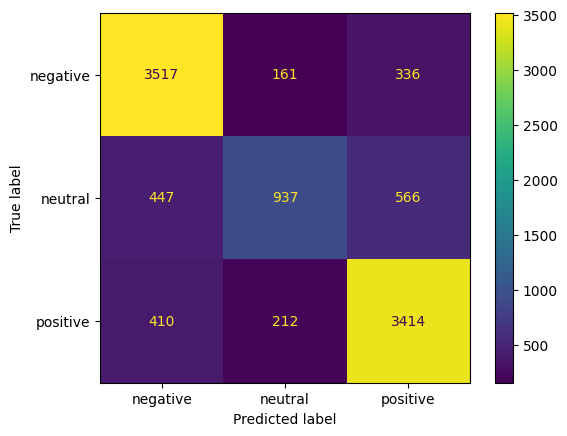

In [33]:
y_pred_test = svm_model.predict(X_test_tfidf)


conf_matrix_test = confusion_matrix(y_test, y_pred_test)

disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix_test, display_labels=["negative","neutral","positive"])

disp.plot()

Display the false predicted results

In [34]:
i=0
for y_pred_test1,y_test1,X_test1 in zip(y_pred_test,y_test,X_test):
    if(y_pred_test1 != y_test1):
        print("the review:",X_test1)
        print("the true rating:",y_test1)
        print("the model rating:",y_pred_test1)
        i+=1
print(i)

the review: Not really a review, sorry
the true rating: positive
the model rating: negative
the review: Sci-fi and philosophy
the true rating: neutral
the model rating: positive
the review: hm
the true rating: neutral
the model rating: positive
the review: Great book-bad ending
the true rating: positive
the model rating: negative
the review: do as you want...
the true rating: neutral
the model rating: positive
the review: colorado
the true rating: positive
the model rating: negative
the review: Never used it....
the true rating: positive
the model rating: negative
the review: Overlooked, for a reason
the true rating: negative
the model rating: positive
the review: How much time do you have?
the true rating: neutral
the model rating: negative
the review: Mehh
the true rating: neutral
the model rating: negative
the review: Who can do it better?
the true rating: positive
the model rating: negative
the review: Disappointed
the true rating: neutral
the model rating: negative
the review: A l

In [35]:
svm_model = SVC(kernel='linear')
svm_model.fit(X_train_tfidf, y_train)

# Predicting on the training set
y_pred_train = svm_model.predict(X_train_tfidf)

# Saving the trained model
save_model(svm_model, "save2.pkl")

# Displaying the classification report for the training data
classification_report_train = classification_report(y_train, y_pred_train)
print("Classification Report for Training Data:\n", classification_report_train)

Classification Report for Training Data:
               precision    recall  f1-score   support

    negative       0.82      0.88      0.85     15986
     neutral       0.76      0.51      0.61      8050
    positive       0.82      0.89      0.85     15964

    accuracy                           0.81     40000
   macro avg       0.80      0.76      0.77     40000
weighted avg       0.81      0.81      0.80     40000



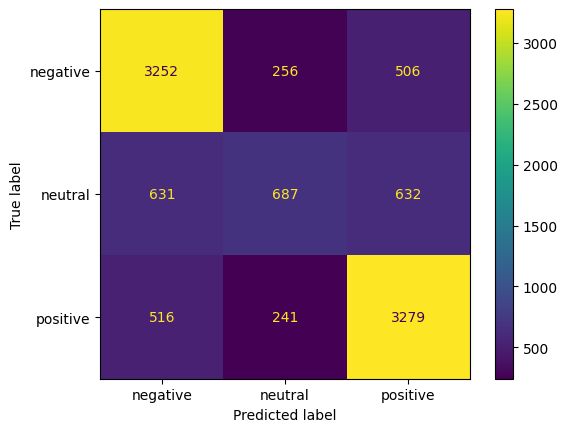

In [36]:
#svm_model= load_model("save2.pkl")
y_pred_test = svm_model.predict(X_test_tfidf)


conf_matrix_test = confusion_matrix(y_test, y_pred_test)

disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix_test, display_labels=["negative","neutral","positive"])

disp.plot()

In [37]:
i=0
for y_pred_test1,y_test1,X_test1 in zip(y_pred_test,y_test,X_test):
    if(y_pred_test1 != y_test1):
        print("the review:",X_test1)
        print("the true rating:",y_test1)
        print("the model rating:",y_pred_test1)
        i+=1
print(i)

the review: Not really a review, sorry
the true rating: positive
the model rating: negative
the review: Give this one a try, you will really like it.
the true rating: positive
the model rating: negative
the review: Sci-fi and philosophy
the true rating: neutral
the model rating: positive
the review: hm
the true rating: neutral
the model rating: negative
the review: Great book-bad ending
the true rating: positive
the model rating: neutral
the review: do as you want...
the true rating: neutral
the model rating: positive
the review: 1 Star as a "Book", 3 Stars as a "Genre Book"
the true rating: negative
the model rating: positive
the review: Never used it....
the true rating: positive
the model rating: negative
the review: Overlooked, for a reason
the true rating: negative
the model rating: positive
the review: Wrox is the best BUT
the true rating: negative
the model rating: neutral
the review: How much time do you have?
the true rating: neutral
the model rating: positive
the review: Mehh

### MLPClassifier

In [38]:
# Create an MLPClassifier
mlp_classifier = MLPClassifier(hidden_layer_sizes=(100, ), max_iter=100, random_state=42,early_stopping=True,activation='tanh')

# Train the classifier
mlp_classifier.fit(X_train_tfidf, y_train)

# Make predictions on the test set
y_pred = mlp_classifier.predict(X_train_tfidf)

# Evaluate the accuracy

classification_report_train = classification_report(y_train, y_pred_train)
print("Classification Report for Training Data:\n", classification_report_train)

Classification Report for Training Data:
               precision    recall  f1-score   support

    negative       0.76      0.80      0.78      4014
     neutral       0.56      0.46      0.51      1950
    positive       0.76      0.78      0.77      4036

    accuracy                           0.73     10000
   macro avg       0.69      0.68      0.69     10000
weighted avg       0.72      0.73      0.72     10000



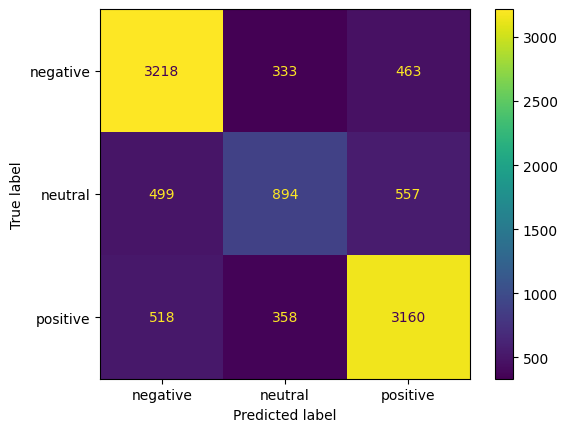

In [39]:

# Make predictions on the test set
y_pred_test = mlp_classifier.predict(X_test_tfidf)

# Calculate the confusion matrix
conf_matrix_test = confusion_matrix(y_test, y_pred_test)

# Display the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix_test, display_labels=["negative", "neutral", "positive"])
disp.plot()

In [40]:
i=0
for y_pred_test1,y_test1,X_test1 in zip(y_pred_test,y_test,X_test):
    if(y_pred_test1 != y_test1):
        print("the review:",X_test1)
        print("the true rating:",y_test1)
        print("the model rating:",y_pred_test1)
        i+=1
print(i)

the review: Not really a review, sorry
the true rating: positive
the model rating: negative
the review: Give this one a try, you will really like it.
the true rating: positive
the model rating: negative
the review: Sci-fi and philosophy
the true rating: neutral
the model rating: positive
the review: Great book-bad ending
the true rating: positive
the model rating: neutral
the review: do as you want...
the true rating: neutral
the model rating: positive
the review: 1 Star as a "Book", 3 Stars as a "Genre Book"
the true rating: negative
the model rating: positive
the review: Never used it....
the true rating: positive
the model rating: negative
the review: Overlooked, for a reason
the true rating: negative
the model rating: positive
the review: Wrox is the best BUT
the true rating: negative
the model rating: neutral
the review: How much time do you have?
the true rating: neutral
the model rating: positive
the review: Still not arrived 8 days later...
the true rating: negative
the model r

## guess the rating from the text review
###  SVC model with kernel function 'rbf'

In [70]:
rating= dataset_rating
X = rating['review/text'].astype(str)
y = rating['review/score'].astype(str)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print("Original dataset size:", rating.shape)
print("Unique values in y_train:", y_train.unique())
print("Unique values in y_test:", y_test.unique())
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

Original dataset size: (49200, 6)
Unique values in y_train: ['1.0' '5.0' '2.0' '4.0' '3.0']
Unique values in y_test: ['1.0' '4.0' '3.0' '2.0' '5.0']
(39360,)
(9840,)
(39360,)
(9840,)


### TF-IDF text vectorization X_train and X_test

In [71]:
tfidf_vectorizer = TfidfVectorizer()

# Vectoriser le dataset de train
X_train_tfidf = tfidf_vectorizer.fit_transform(X_train)
# Vectoriser le dataset de test
X_test_tfidf = tfidf_vectorizer.transform(X_test)

In [72]:
# Créer un modèle SVM linéaire
svm_model = SVC(kernel='rbf')

# Entraîner le modèle sur les représentations vectorielles d'entraînement
svm_model.fit(X_train_tfidf, y_train)

# Prédire les classes sur les représentations d'entraînement
y_pred_train = svm_model.predict(X_train_tfidf)

save_model(svm_model)

# Afficher le rapport de classification pour les données d'entraînement
classification_report_train = classification_report(y_train, y_pred_train)
print("Rapport de classification pour les données de test:\n", classification_report_train)

Rapport de classification pour les données de test:
               precision    recall  f1-score   support

         1.0       0.98      0.98      0.98      7970
         2.0       0.98      0.98      0.98      7384
         3.0       0.96      0.96      0.96      8007
         4.0       0.95      0.94      0.94      8002
         5.0       0.95      0.95      0.95      7997

    accuracy                           0.96     39360
   macro avg       0.96      0.96      0.96     39360
weighted avg       0.96      0.96      0.96     39360



- Results

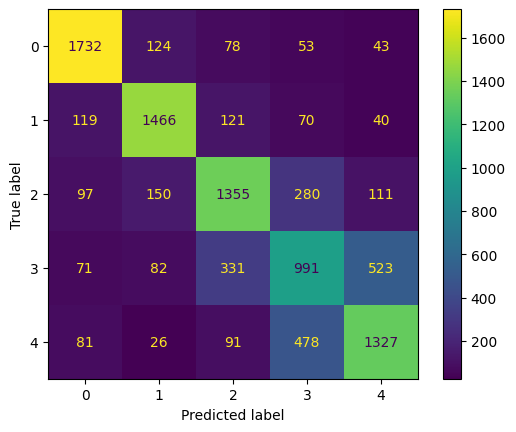

In [74]:
# Print/plot the confusion matrix


y_pred_test = svm_model.predict(X_test_tfidf)


conf_matrix_test = confusion_matrix(y_test, y_pred_test)

disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix_test)

disp.plot()

- Display the false predicted results

In [75]:
i=0
for y_pred_test1,y_test1,X_test1 in zip(y_pred_test,y_test,X_test):
    if(y_pred_test1 != y_test1):
        print("the review:",X_test1)
        print("the true rating:",y_test1)
        print("the model rating:",y_pred_test1)
        i+=1
print(i)

the review: Kevin Phillips say the three major peril facing America are : shrinking oil supply , radicalized religion , and reliance on borrowed money . Oil politics created Anglo-American activity in the Middle East since around 1901 . [ The first and second World Wars were over oil , and so will the third World War . Has it started already ? ] The `` Armageddon huckster '' represent the growing power of religious group ( who is behind them ? ) . The ballooning deficit are another peril , with declining manufacturing . Phillips mention theocracy like Puritan New England of Mormon Utah . These condition have caused the downfall of former leading world economic power ( p.ix ) . `` Exploding consumer debt '' is a euphemism for impoverishing America . [ No mention of the devaluation of the dollar since 1971 a contributing to this . ] The Bush dynasty ha been one of the leading family of the American ruling class.Chapter 1 say declining US oil production will force a military invasion of t